In [1]:
# Computing the uncertainty of a segmentation model like U-Net can be done using
# Monte Carlo Dropout (MC Dropout). MC Dropout is a technique where dropout is 
# applied during both training and testing, and multiple forward passes are 
# made to compute the uncertainty.

In [2]:
import os

import cv2
import matplotlib.pyplot as plt
import pandas as pd
import torch
from PIL import Image

from utils.dl.models.mcd_unet import MCDUNet
from utils.dl.dataset import IMG_TRANSFORMS
from utils.dl.mc_dropout_uncertainty import predict_with_uncertainty
from utils.image_utils import load_image_ts, reduce_resolution, white_balance

/home/users/ashine/miniconda3/envs/niab/lib/python3.12/site-packages/torchvision/transforms/v2/_deprecated.py:41: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.
  warnings.warn(


In [3]:
# Load uncertainties from csv file (generated by the 
# scripts/active_learning_labelling.py script)
df = pd.read_csv("../sample_data/uncertainty.csv")

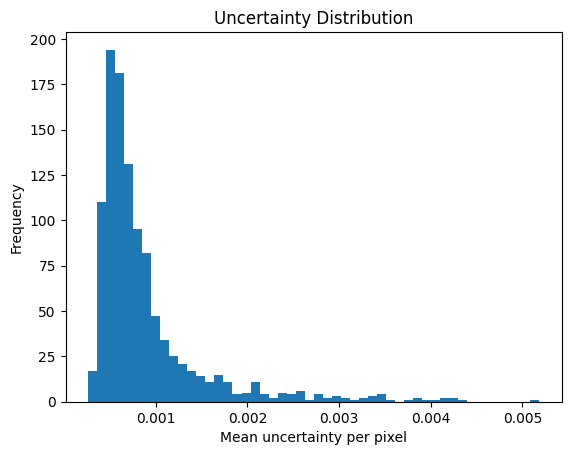

In [4]:
# Plot histogram of mean uncertainties
plt.hist(df["mean_uncertainty"], bins=50)
plt.xlabel("Mean uncertainty per pixel")
plt.ylabel("Frequency")
plt.title("Uncertainty Distribution")
plt.show()

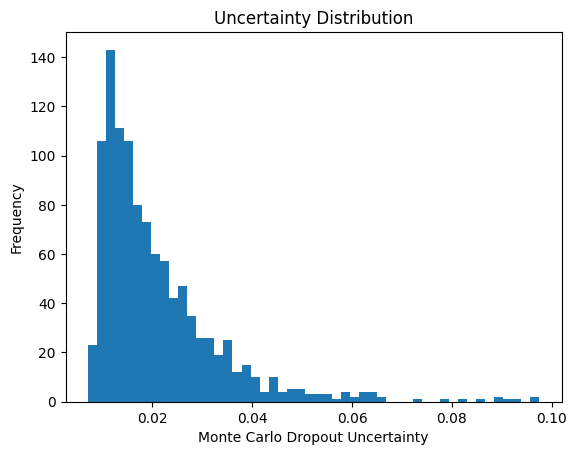

In [5]:
# Plot histogram of MC dropout uncertainties
plt.hist(df["mcd_uncertainty"], bins=50)
plt.xlabel("Monte Carlo Dropout Uncertainty")
plt.ylabel("Frequency")
plt.title("Uncertainty Distribution")
plt.show()

In [6]:
# Get the images with the highest uncertainty
most_uncertain = df.nlargest(15, "mcd_uncertainty")

print("Most uncertain images:")
print(most_uncertain)

Most uncertain images:
                                              img_path  mean_uncertainty  \
10   /home/users/ashine/gws/niab-automated-phenotyp...          0.001473   
9    /home/users/ashine/gws/niab-automated-phenotyp...          0.001682   
29   /home/users/ashine/gws/niab-automated-phenotyp...          0.001351   
13   /home/users/ashine/gws/niab-automated-phenotyp...          0.001131   
25   /home/users/ashine/gws/niab-automated-phenotyp...          0.001485   
12   /home/users/ashine/gws/niab-automated-phenotyp...          0.001080   
19   /home/users/ashine/gws/niab-automated-phenotyp...          0.001284   
14   /home/users/ashine/gws/niab-automated-phenotyp...          0.001348   
18   /home/users/ashine/gws/niab-automated-phenotyp...          0.001142   
549  /home/users/ashine/gws/niab-automated-phenotyp...          0.001178   
328  /home/users/ashine/gws/niab-automated-phenotyp...          0.000986   
4    /home/users/ashine/gws/niab-automated-phenotyp...          0

In [7]:
# print each of the image paths
for img_path in most_uncertain["img_path"]:
    print(img_path)

/home/users/ashine/gws/niab-automated-phenotyping/datasets/niab/EXP01/Top_Images/Top_Images_Clean_Rename/EXP01_Block01/EXP01_Block01_Rename01_20201123/Exp01_Block01_Image01_Pot011.jpg
/home/users/ashine/gws/niab-automated-phenotyping/datasets/niab/EXP01/Top_Images/Top_Images_Clean_Rename/EXP01_Block01/EXP01_Block01_Rename01_20201123/Exp01_Block01_Image01_Pot010.jpg
/home/users/ashine/gws/niab-automated-phenotyping/datasets/niab/EXP01/Top_Images/Top_Images_Clean_Rename/EXP01_Block01/EXP01_Block01_Rename01_20201123/Exp01_Block01_Image01_Pot030.jpg
/home/users/ashine/gws/niab-automated-phenotyping/datasets/niab/EXP01/Top_Images/Top_Images_Clean_Rename/EXP01_Block01/EXP01_Block01_Rename01_20201123/Exp01_Block01_Image01_Pot014.jpg
/home/users/ashine/gws/niab-automated-phenotyping/datasets/niab/EXP01/Top_Images/Top_Images_Clean_Rename/EXP01_Block01/EXP01_Block01_Rename01_20201123/Exp01_Block01_Image01_Pot026.jpg
/home/users/ashine/gws/niab-automated-phenotyping/datasets/niab/EXP01/Top_Images

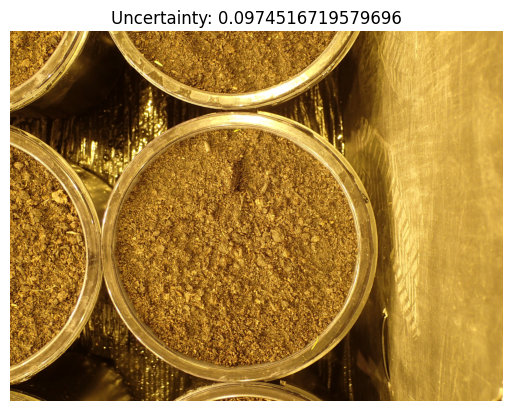

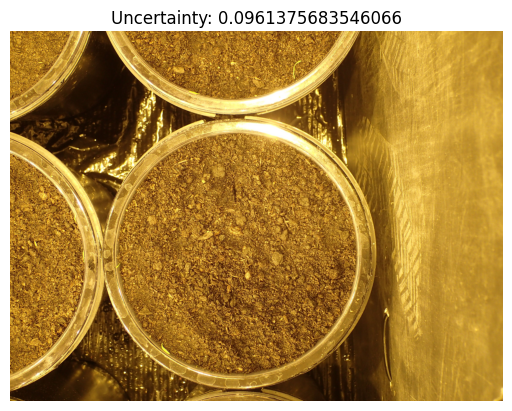

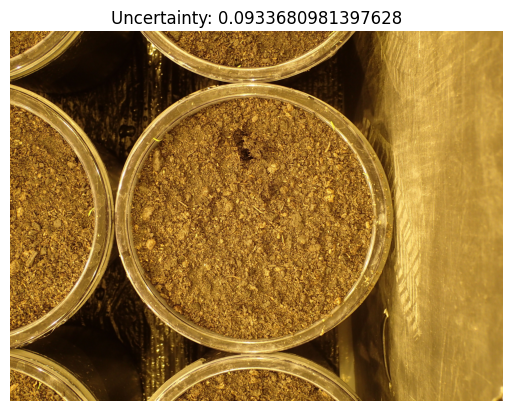

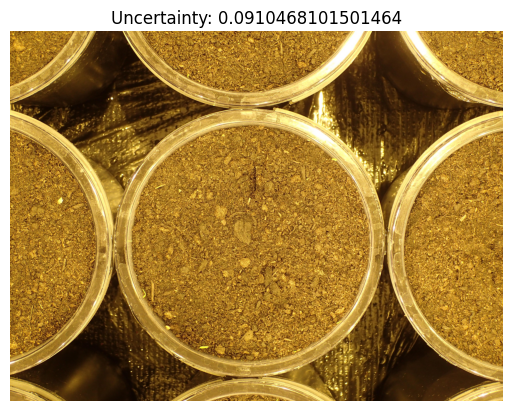

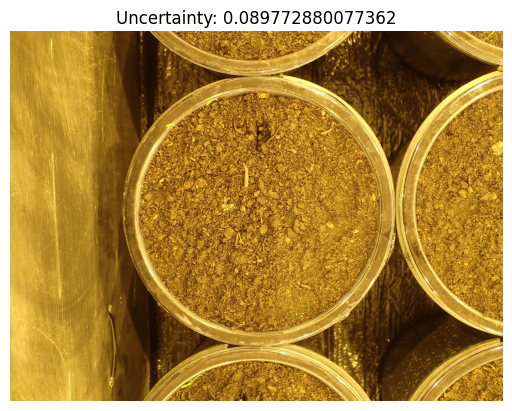

...

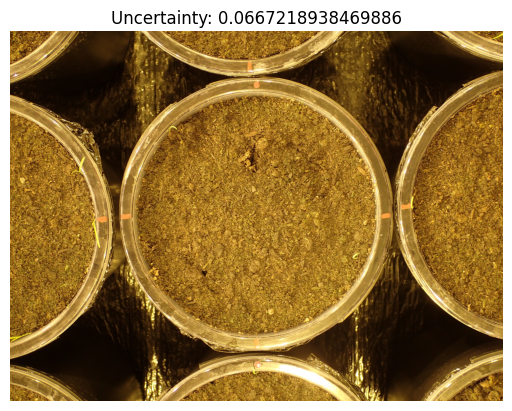

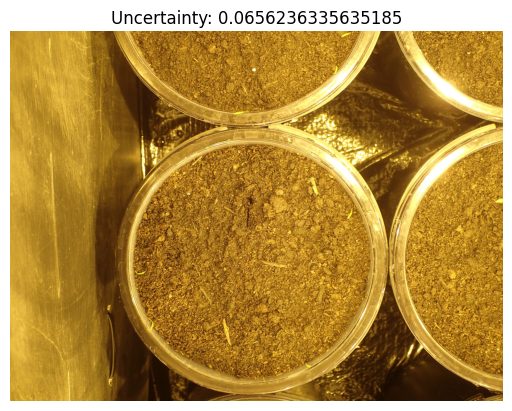

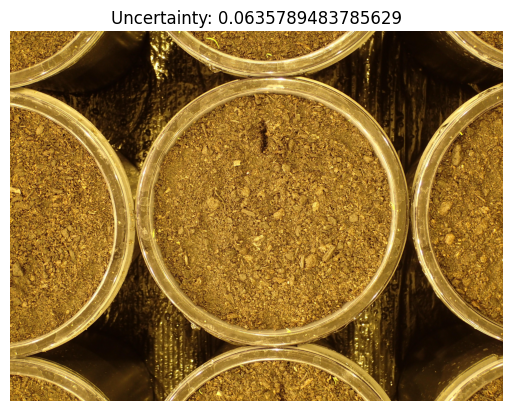

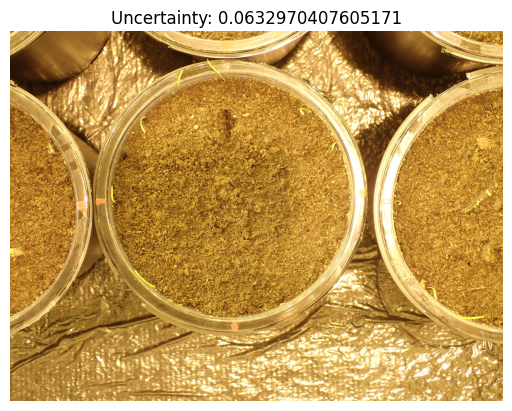

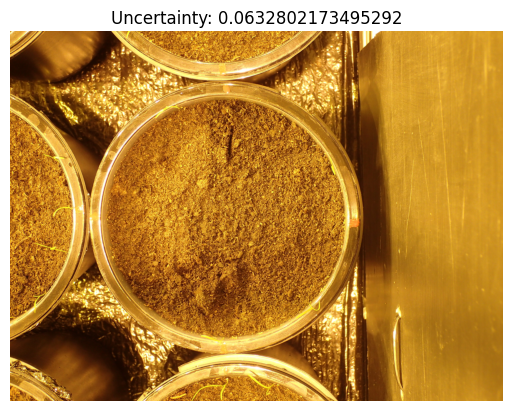

In [8]:
# Display the top 10 images with highest MC dropout uncertainty

for index, row in most_uncertain.iterrows():
    image_path = row["img_path"]
    image_path = os.path.join("..", image_path)
    uncertainty = row["mcd_uncertainty"]
    image = plt.imread(image_path)
    plt.imshow(image)
    plt.title(f"Uncertainty: {uncertainty}")
    plt.axis("off")
    plt.show()

Running model using cuda device


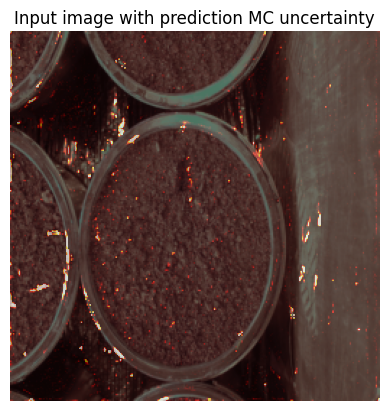

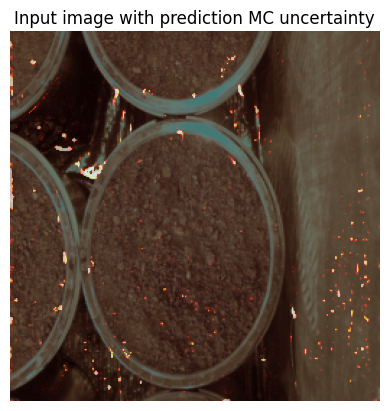

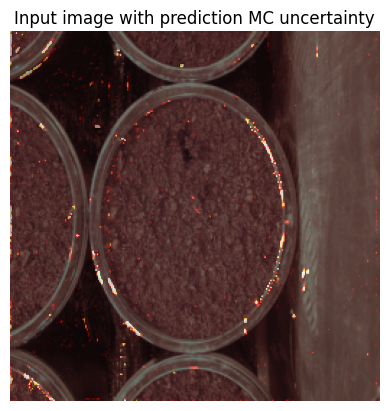

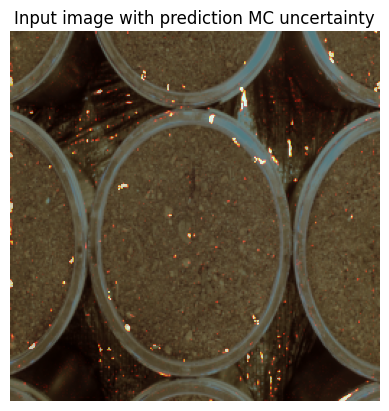

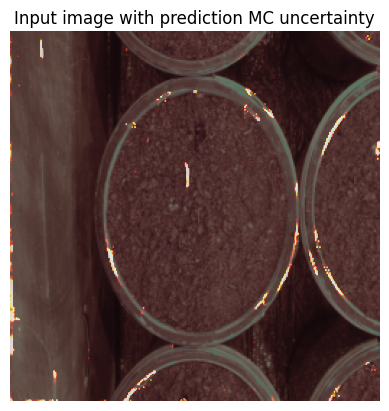

...

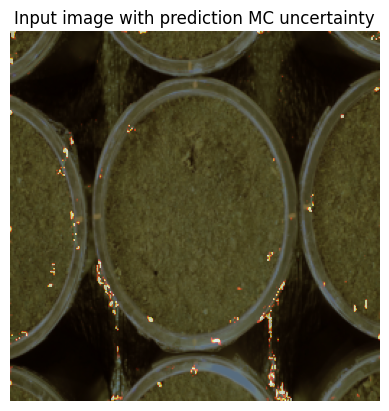

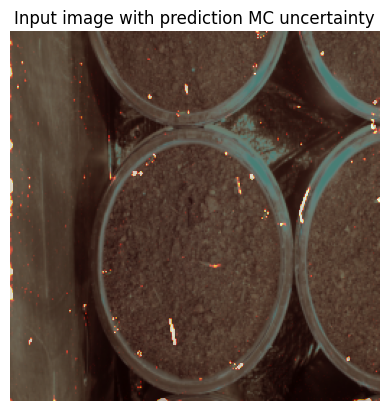

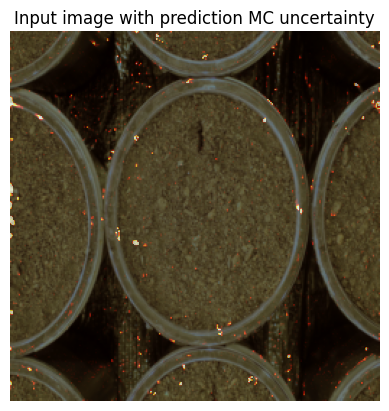

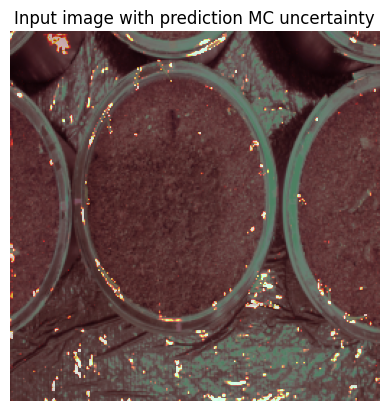

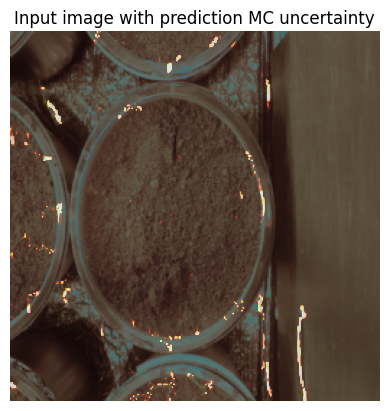

In [9]:
# Display uncertainty heatmap overlayed on the image

MODEL_PATH = "../models_2/20240605150017/best_model.pth"

device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Running model using {device} device")

# Create an instance of the model and move it to the device (GPU or CPU)
model = MCDUNet(
    n_channels=3,
    n_classes=1,
    bilinear=True,
    ddims=[32, 64, 128, 256, 512],
    UQ=True,
    activation=True,
).to(device)

model.load_state_dict(torch.load(MODEL_PATH))

# load and parse image to predict with uncertay function and plot the uncertaity matrix / image for the top 10 images
for index, row in most_uncertain.iterrows():
    # Get the most uncertain image path
    image_path = row["img_path"]
    image_path = os.path.join("..", image_path)
    uncertainty = row["mcd_uncertainty"]
    
    # Pre-process the image before passing it to the model
    img = white_balance(cv2.imread(image_path))
    img = Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    img = IMG_TRANSFORMS(img)
    
    # Inference with uncertainty
    mean, variance = predict_with_uncertainty(model, img, device)  # Monte Carlo Dropout at inference time
    uncertainty_image = variance
    uncertainty_image = uncertainty_image.squeeze().cpu().detach().numpy()
  
    # Plot uncertainty image overlayed on the original image
    plt.imshow(img.squeeze().permute(1, 2, 0))
    plt.imshow(uncertainty_image, alpha=0.5, cmap="hot", vmin=0, vmax=0.1)
    plt.title(f"Input image with prediction MC uncertainty")
    plt.axis("off")
    plt.show()